In [47]:
import anndata as ad
import scanpy as sc
import numpy as np
import pandas as pd
import scipy as sp
import dynchro

In [4]:
# x_conversion can be a function for converting the values, such as int or float
def read_matrix(base_file, x_conversion = int):
    with open(f"{base_file}_i.csv") as fi, open(f"{base_file}_j.csv") as fj, open(f"{base_file}_x.csv") as fx:
        i = fi.read().splitlines()
        j = fj.read().splitlines()
        x = fx.read().splitlines()

        i = [int(x) - 1 for x in i]
        j = [int(x) - 1 for x in j]
        x = [x_conversion(x) for x in x]
    counts = sp.sparse.csc_matrix((x, (j, i)))
    
    return counts

In [5]:
def to_anndata(basefile, colData = True):
    counts = read_matrix(f"{basefile}_counts_triples")
    # logcounts = read_matrix(f"{basefile}_logcounts_triples", x_conversion = float)

    if colData:
        coldata = pd.read_csv(f"{basefile}_colData.csv", index_col = 0)
    
    rownames = pd.read_csv(f"{basefile}_rownames.csv", index_col = 0)
    colnames = pd.read_csv(f"{basefile}_colnames.csv", index_col = 0)

    if colData:
        adata = ad.AnnData(X = counts, obs = coldata, var = rownames)#, layers = {"logcounts": logcounts})
    else:
        adata = ad.AnnData(X = counts, obs = colnames, var = rownames)#, layers = {"logcounts": logcounts})

    return adata

In [6]:
basefile = "kras"
colData = pd.read_csv(f"{basefile}_colData.csv", index_col = 0)
colData

/tmp/ipykernel_142037/911289720.py:2: DtypeWarning: Columns (84,85) have mixed types. Specify dtype option on import or set low_memory=False.
  colData = pd.read_csv(f"{basefile}_colData.csv", index_col = 0)


,X1,nGene,nUMI,Condition,Order,ID,Hours,Line,Batch,orig.ident,...,DC2,W1,W2,slingClusters,slingPseudotime_1,slingPseudotime_2,slingPseudotime_3,slingPseudotime_1.1,slingPseudotime_2.1,slingPseudotime_3.1
H358_A_AAACATACATAAGG,H358_A_AAACATACATAAGG,3175,13145,untreated,A_1,A,0,H358,H358A,baseline,...,0.001035,0.966112,0.121402,6,228.228989,63.173280,66.188589,228.228989,63.173280,66.188589
H358_A_AAACATACATACCG,H358_A_AAACATACATACCG,2730,9232,untreated,A_2,A,0,H358,H358A,baseline,...,0.008589,-0.183968,-0.536562,9,105.172743,107.767287,NaN,105.172743,107.767287,NaN
H358_A_AAACATACGCTTCC,H358_A_AAACATACGCTTCC,3252,12805,untreated,A_3,A,0,H358,H358A,baseline,...,0.013218,0.925753,-0.484225,8,75.087323,77.638880,89.519268,75.087323,77.638880,89.519268
H358_A_AAACATTGTGTAGC,H358_A_AAACATTGTGTAGC,1850,5191,untreated,A_4,A,0,H358,H358A,baseline,...,-0.003661,1.564642,1.119683,1,213.169006,NaN,NaN,213.169006,NaN,NaN
H358_A_AAACCGTGACCTGA,H358_A_AAACCGTGACCTGA,3193,12372,untreated,A_5,A,0,H358,H358A,baseline,...,0.011770,0.911727,-0.436649,8,75.060011,77.016718,88.068184,75.060011,77.016718,88.068184
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SW1573_D_TTGGTACTCGGGAA,SW1573_D_TTGGTACTCGGGAA,2475,9366,treated,D_1531,D,72,SW1573,SW1573A,RASi_72h,...,-0.002103,1.170528,0.440533,1,215.196487,NaN,NaN,215.196487,NaN,NaN
SW1573_D_TTGTAGCTCCCTCA,SW1573_D_TTGTAGCTCCCTCA,3007,10843,treated,D_1532,D,72,SW1573,SW1573A,RASi_72h,...,-0.018185,0.069644,0.430227,4,2.224167,NaN,NaN,2.224167,NaN,NaN
SW1573_D_TTGTAGCTGTAGGG,SW1573_D_TTGTAGCTGTAGGG,2939,11566,treated,D_1533,D,72,SW1573,SW1573A,RASi_72h,...,-0.016876,-0.083660,0.718360,4,0.000000,NaN,NaN,0.000000,NaN,NaN
SW1573_D_TTTAGAGATCAGAC,SW1573_D_TTTAGAGATCAGAC,2564,8966,treated,D_1535,D,72,SW1573,SW1573A,RASi_72h,...,-0.002506,1.210979,0.560762,1,214.778565,NaN,NaN,214.778565,NaN,NaN


In [7]:
kras = to_anndata(basefile)

/tmp/ipykernel_142037/3908922237.py:6: DtypeWarning: Columns (84,85) have mixed types. Specify dtype option on import or set low_memory=False.
  coldata = pd.read_csv(f"{basefile}_colData.csv", index_col = 0)
/home/louise/Work/dynchro/lib/python3.11/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [18]:
kras

AnnData object with n_obs × n_vars = 10177 × 4788
    obs: 'X1', 'nGene', 'nUMI', 'Condition', 'Order', 'ID', 'Hours', 'Line', 'Batch', 'orig.ident', 'is_cell_control', 'total_features_by_counts', 'log10_total_features_by_counts', 'total_counts', 'log10_total_counts', 'pct_counts_in_top_50_features', 'pct_counts_in_top_100_features', 'pct_counts_in_top_200_features', 'pct_counts_in_top_500_features', 'total_features', 'log10_total_features', 'pct_counts_top_50_features', 'pct_counts_top_100_features', 'pct_counts_top_200_features', 'pct_counts_top_500_features', 'total_features_by_counts_endogenous', 'log10_total_features_by_counts_endogenous', 'total_counts_endogenous', 'log10_total_counts_endogenous', 'pct_counts_endogenous', 'pct_counts_in_top_50_features_endogenous', 'pct_counts_in_top_100_features_endogenous', 'pct_counts_in_top_200_features_endogenous', 'pct_counts_in_top_500_features_endogenous', 'total_features_endogenous', 'log10_total_features_endogenous', 'pct_counts_top_50_

In [25]:
np.column_stack((kras.obs["tSNE1"], kras.obs["tSNE2"]))

array([[ 48.26506623,   1.64300147],
       [ -3.18568205, -17.30142241],
       [ 32.548926  , -26.48827808],
       ...,
       [ -9.11522789,  45.90514194],
       [ 46.13646796,  21.12537076],
       [-18.40343804, -39.92320259]])

In [26]:
kras.obsm["X_tsne"] = np.column_stack((kras.obs["tSNE1"], kras.obs["tSNE2"]))

/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


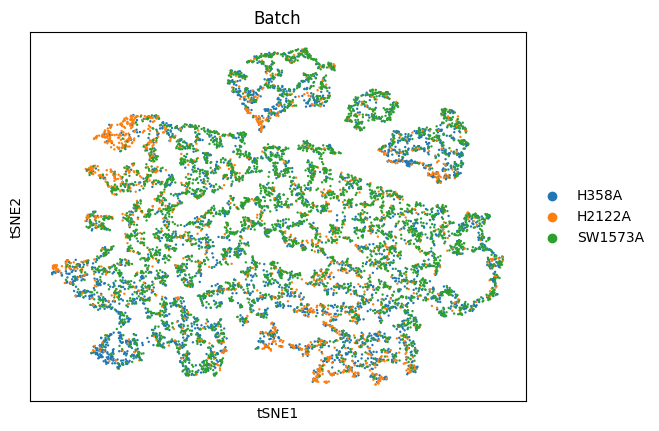

In [28]:
sc.pl.tsne(kras, color = "Batch")

In [12]:
kras.obs.keys().values


array(['X1', 'nGene', 'nUMI', 'Condition', 'Order', 'ID', 'Hours', 'Line',
       'Batch', 'orig.ident', 'is_cell_control',
       'total_features_by_counts', 'log10_total_features_by_counts',
       'total_counts', 'log10_total_counts',
       'pct_counts_in_top_50_features', 'pct_counts_in_top_100_features',
       'pct_counts_in_top_200_features', 'pct_counts_in_top_500_features',
       'total_features', 'log10_total_features',
       'pct_counts_top_50_features', 'pct_counts_top_100_features',
       'pct_counts_top_200_features', 'pct_counts_top_500_features',
       'total_features_by_counts_endogenous',
       'log10_total_features_by_counts_endogenous',
       'total_counts_endogenous', 'log10_total_counts_endogenous',
       'pct_counts_endogenous',
       'pct_counts_in_top_50_features_endogenous',
       'pct_counts_in_top_100_features_endogenous',
       'pct_counts_in_top_200_features_endogenous',
       'pct_counts_in_top_500_features_endogenous',
       'total_features_

In [ ]:
# batches:
# 1: H358A
# 2: H2122A
# 3: SW1573A

In [14]:
sds1 = pd.read_csv("sds_1.csv", index_col = 0)
sds2 = pd.read_csv("sds_2.csv", index_col = 0)
sds3 = pd.read_csv("sds_3.csv", index_col = 0)
sds1

,Lineage1,Lineage2,Lineage3
H358_A_AAACATACATAAGG,227.110266,35.306045,38.424307
H358_A_AAACATACATACCG,69.526306,74.058646,NaN
H358_A_AAACATACGCTTCC,43.798786,47.532594,57.768956
H358_A_AAACATTGTGTAGC,219.245668,NaN,NaN
H358_A_AAACCGTGACCTGA,43.067133,46.928232,55.888593
...,...,...,...
H358_D_TTTCGAACTTCTAC,55.886409,62.428196,80.242593
H358_D_TTTCTACTATGCTG,59.442349,66.210501,83.841771
H358_D_TTTCTACTTAGAAG,38.312964,40.130121,39.154061
H358_D_TTTGACTGAAGTAG,85.093972,NaN,NaN


In [30]:
kras1 = kras[["H358A" in x for x in kras.obs["Batch"]]]
kras2 = kras[["H2122A" in x for x in kras.obs["Batch"]]]
kras3 = kras[["SW1573A" in x for x in kras.obs["Batch"]]]

In [31]:
(kras1, kras2, kras3)

(View of AnnData object with n_obs × n_vars = 4059 × 4788
     obs: 'X1', 'nGene', 'nUMI', 'Condition', 'Order', 'ID', 'Hours', 'Line', 'Batch', 'orig.ident', 'is_cell_control', 'total_features_by_counts', 'log10_total_features_by_counts', 'total_counts', 'log10_total_counts', 'pct_counts_in_top_50_features', 'pct_counts_in_top_100_features', 'pct_counts_in_top_200_features', 'pct_counts_in_top_500_features', 'total_features', 'log10_total_features', 'pct_counts_top_50_features', 'pct_counts_top_100_features', 'pct_counts_top_200_features', 'pct_counts_top_500_features', 'total_features_by_counts_endogenous', 'log10_total_features_by_counts_endogenous', 'total_counts_endogenous', 'log10_total_counts_endogenous', 'pct_counts_endogenous', 'pct_counts_in_top_50_features_endogenous', 'pct_counts_in_top_100_features_endogenous', 'pct_counts_in_top_200_features_endogenous', 'pct_counts_in_top_500_features_endogenous', 'total_features_endogenous', 'log10_total_features_endogenous', 'pct_count

In [33]:
kras1.obs["lin1"] = sds1.loc[kras1.obs_names, "Lineage1"]
kras1.obs["lin2"] = sds1.loc[kras1.obs_names, "Lineage2"]
kras1.obs["lin3"] = sds1.loc[kras1.obs_names, "Lineage3"]

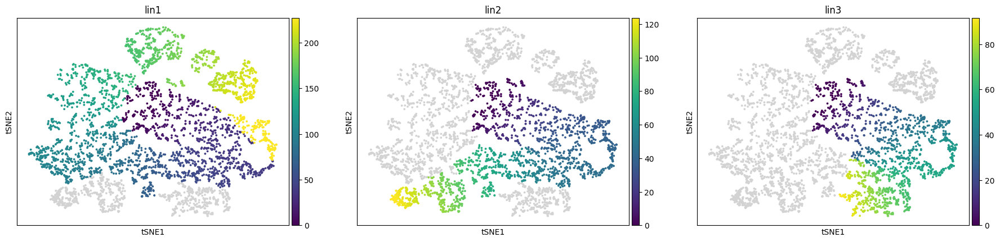

In [34]:
sc.pl.tsne(kras1, color = ["lin1", "lin2", "lin3"])

In [75]:
# select cells that belong to milestone 6 and lin1 > 150
kras1_m6 = kras1[(kras1.obs["lin1"] > 150) & (kras1.obs["milestones"] == "6")]

In [84]:
kras1_m6 = kras1[(kras1.obs["lin1"] > 150) & (kras1.obs["milestones"] == "6")]
k1rm = kras1_m6.obs_names.values
np.savetxt("kras1_remove.csv", k1rm, delimiter = ",", fmt = "%s")

/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(


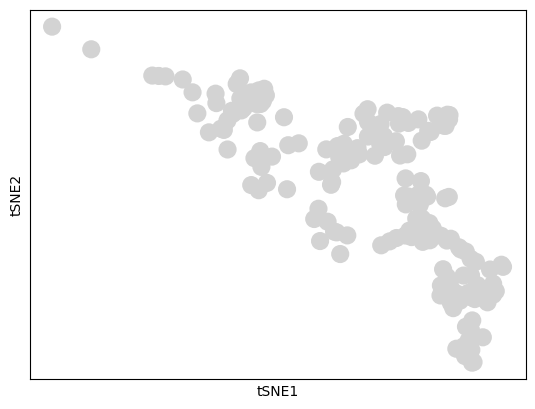

In [78]:
sc.pl.tsne(kras1_m6)

/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


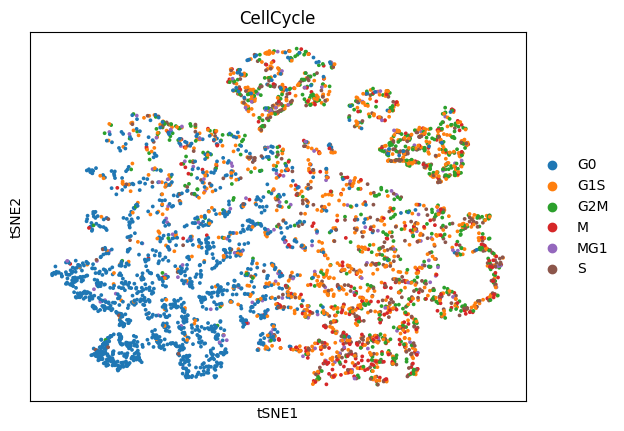

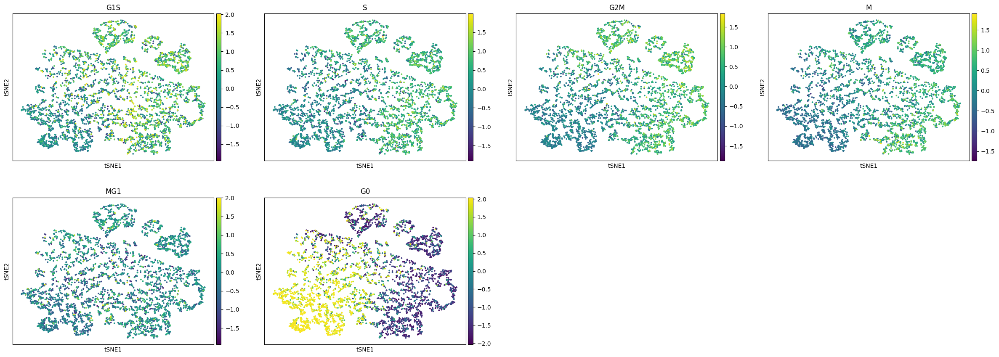

In [74]:
sc.pl.tsne(kras1, color = "CellCycle")
sc.pl.tsne(kras1, color = ['G1S', 'S', 'G2M', 'M', 'MG1', 'G0'])

In [71]:
kras1.obs["lin1"]

H358_A_AAACATACATAAGG    227.110266
H358_A_AAACATACATACCG     69.526306
H358_A_AAACATACGCTTCC     43.798786
H358_A_AAACATTGTGTAGC    219.245668
H358_A_AAACCGTGACCTGA     43.067133
                            ...    
H358_D_TTTCGAACTTCTAC     55.886409
H358_D_TTTCTACTATGCTG     59.442349
H358_D_TTTCTACTTAGAAG     38.312964
H358_D_TTTGACTGAAGTAG     85.093972
H358_D_TTTGACTGACGACT     66.429605
Name: lin1, Length: 4059, dtype: float64

In [72]:
kras1.obs["lin2"]

H358_A_AAACATACATAAGG    35.306045
H358_A_AAACATACATACCG    74.058646
H358_A_AAACATACGCTTCC    47.532594
H358_A_AAACATTGTGTAGC          NaN
H358_A_AAACCGTGACCTGA    46.928232
                           ...    
H358_D_TTTCGAACTTCTAC    62.428196
H358_D_TTTCTACTATGCTG    66.210501
H358_D_TTTCTACTTAGAAG    40.130121
H358_D_TTTGACTGAAGTAG          NaN
H358_D_TTTGACTGACGACT    76.516735
Name: lin2, Length: 4059, dtype: float64

In [35]:
kras2.obs["lin1"] = sds2.loc[kras2.obs_names, "Lineage1"]
kras2.obs["lin2"] = sds2.loc[kras2.obs_names, "Lineage2"]
kras2.obs["lin3"] = sds2.loc[kras2.obs_names, "Lineage3"]

/tmp/ipykernel_142037/1810952764.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  kras2.obs["lin1"] = sds2.loc[kras2.obs_names, "Lineage1"]


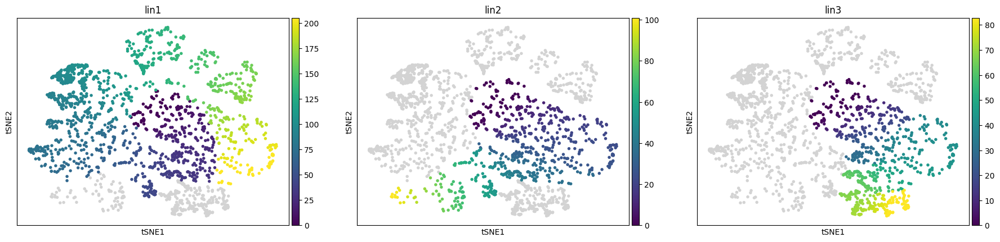

In [36]:
sc.pl.tsne(kras2, color = ["lin1", "lin2", "lin3"])

In [85]:
kras2_m6 = kras2[(kras2.obs["lin1"] > 100) & (kras2.obs["milestones"] == "6")]
k2rm = kras2_m6.obs_names.values
np.savetxt("kras2_remove.csv", k2rm, delimiter = ",", fmt = "%s")

In [38]:
kras3.obs["lin1"] = sds3.loc[kras3.obs_names, "Lineage1"]
kras3.obs["lin2"] = sds3.loc[kras3.obs_names, "Lineage2"]
kras3.obs["lin3"] = sds3.loc[kras3.obs_names, "Lineage3"]

/tmp/ipykernel_142037/3941699695.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  kras3.obs["lin1"] = sds3.loc[kras3.obs_names, "Lineage1"]


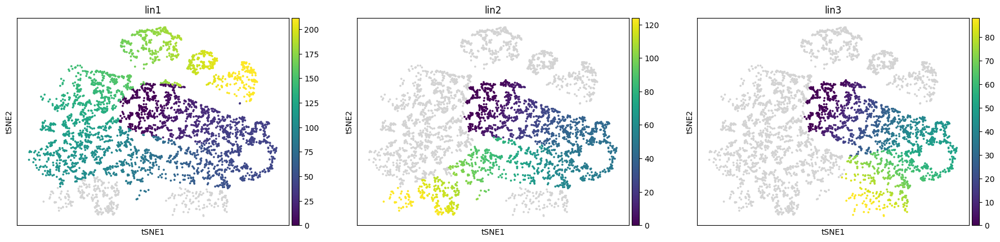

In [39]:
sc.pl.tsne(kras3, color = ["lin1", "lin2", "lin3"])

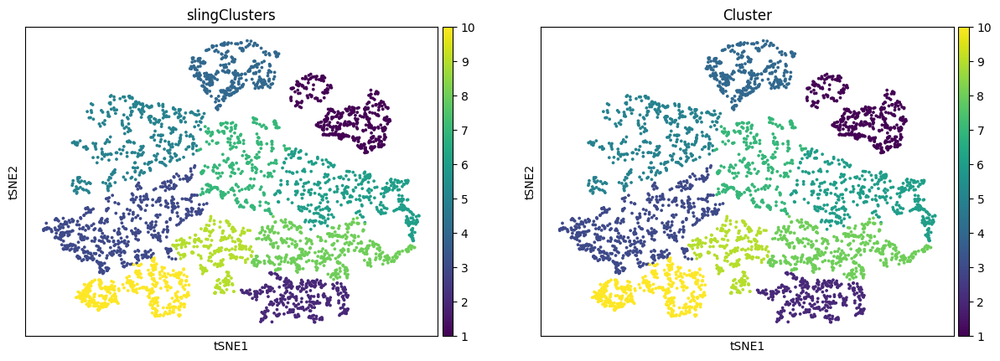

In [54]:
sc.pl.tsne(kras1, color = ["slingClusters", "Cluster"])

In [41]:
kras1.obs.keys().values

array(['X1', 'nGene', 'nUMI', 'Condition', 'Order', 'ID', 'Hours', 'Line',
       'Batch', 'orig.ident', 'is_cell_control',
       'total_features_by_counts', 'log10_total_features_by_counts',
       'total_counts', 'log10_total_counts',
       'pct_counts_in_top_50_features', 'pct_counts_in_top_100_features',
       'pct_counts_in_top_200_features', 'pct_counts_in_top_500_features',
       'total_features', 'log10_total_features',
       'pct_counts_top_50_features', 'pct_counts_top_100_features',
       'pct_counts_top_200_features', 'pct_counts_top_500_features',
       'total_features_by_counts_endogenous',
       'log10_total_features_by_counts_endogenous',
       'total_counts_endogenous', 'log10_total_counts_endogenous',
       'pct_counts_endogenous',
       'pct_counts_in_top_50_features_endogenous',
       'pct_counts_in_top_100_features_endogenous',
       'pct_counts_in_top_200_features_endogenous',
       'pct_counts_in_top_500_features_endogenous',
       'total_features_

/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


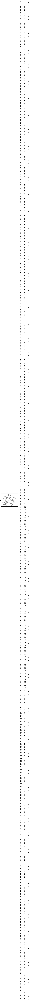

In [93]:
sc.pl.tsne(kras1, color = ["Order"])

/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


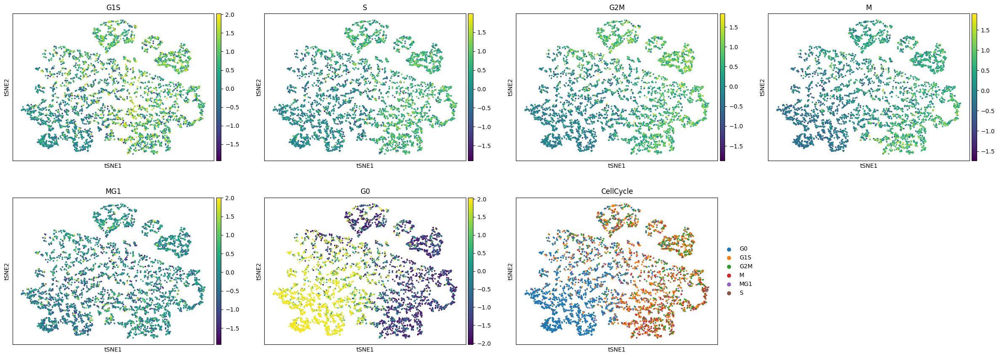

In [102]:
sc.pl.tsne(kras1, color = [ 'G1S', 'S', 'G2M', 'M', 'MG1', 'G0', 'CellCycle'])

/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


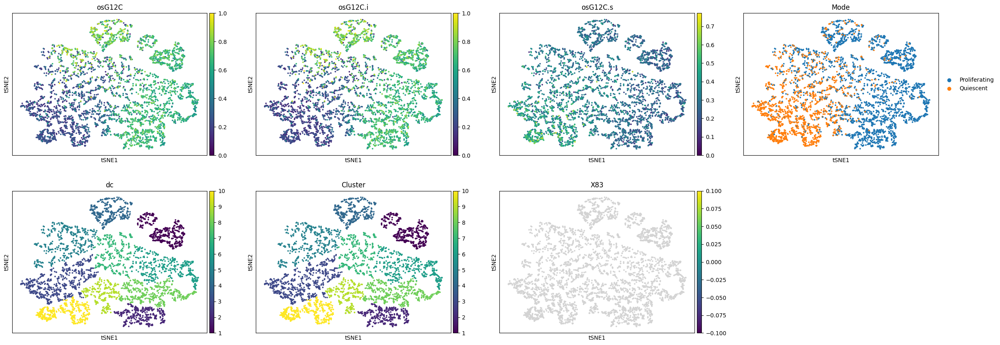

In [98]:
sc.pl.tsne(kras1, color = ['osG12C', 'osG12C.i', 'osG12C.s', 'Mode', 'dc', 'Cluster','X83'])

In [101]:
kras1

AnnData object with n_obs × n_vars = 4059 × 4788
    obs: 'X1', 'nGene', 'nUMI', 'Condition', 'Order', 'ID', 'Hours', 'Line', 'Batch', 'orig.ident', 'is_cell_control', 'total_features_by_counts', 'log10_total_features_by_counts', 'total_counts', 'log10_total_counts', 'pct_counts_in_top_50_features', 'pct_counts_in_top_100_features', 'pct_counts_in_top_200_features', 'pct_counts_in_top_500_features', 'total_features', 'log10_total_features', 'pct_counts_top_50_features', 'pct_counts_top_100_features', 'pct_counts_top_200_features', 'pct_counts_top_500_features', 'total_features_by_counts_endogenous', 'log10_total_features_by_counts_endogenous', 'total_counts_endogenous', 'log10_total_counts_endogenous', 'pct_counts_endogenous', 'pct_counts_in_top_50_features_endogenous', 'pct_counts_in_top_100_features_endogenous', 'pct_counts_in_top_200_features_endogenous', 'pct_counts_in_top_500_features_endogenous', 'total_features_endogenous', 'log10_total_features_endogenous', 'pct_counts_top_50_f

In [99]:
sc.pl.tsne(kras1, color = ["KRAS", "HBEGF", "AURKA"])

KeyError: 'Could not find key KRAS in .var_names or .obs.columns.'

<Figure size 2183.4x480 with 0 Axes>

/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


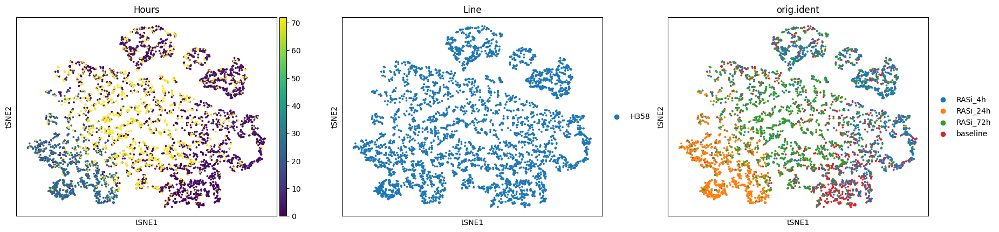

In [96]:
sc.pl.tsne(kras1, color = ["Hours", "Line", "orig.ident"])

/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


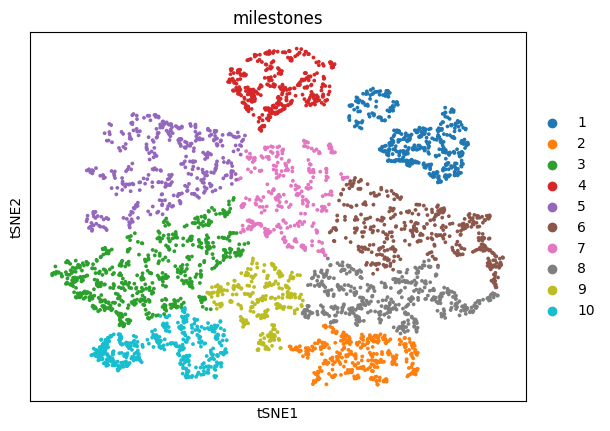

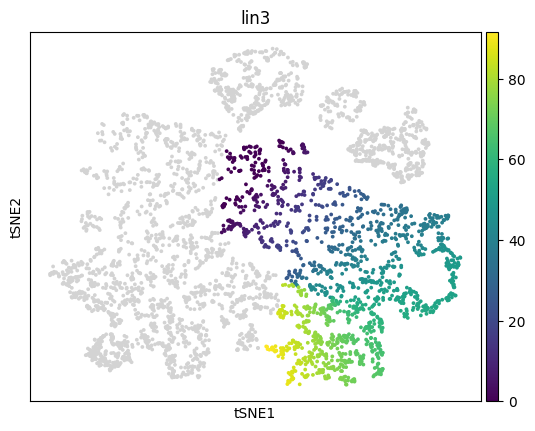

In [60]:
sc.pl.tsne(kras1, color = "milestones")
sc.pl.tsne(kras1, color = "lin3")

In [61]:
kras1.obs["milestones"] = kras1.obs["slingClusters"].astype(str)
kras1.obs["pseudotime1"] = sds1.loc[kras1.obs_names, "Lineage1"]
kras1.obs["pseudotime2"] = sds1.loc[kras1.obs_names, "Lineage2"]
kras1.obs["pseudotime3"] = sds1.loc[kras1.obs_names, "Lineage3"]
kras1.uns["lineage_labels"] = []

lineage1_clusters = ["7", "6", "8", "9", "3", "5", "4", "1"]
lineage2_clusters = ["7", "6", "8", "9", "10"]
lineage3_clusters = ["7", "6", "8", "2"]

dynchro.pp.label_lineage(kras1, "milestones", lineage1_clusters, "Lineage1")
dynchro.pp.label_lineage(kras1, "milestones", lineage2_clusters, "Lineage2")
dynchro.pp.label_lineage(kras1, "milestones", lineage3_clusters, "Lineage3")

AnnData object with n_obs × n_vars = 4059 × 4788
    obs: 'X1', 'nGene', 'nUMI', 'Condition', 'Order', 'ID', 'Hours', 'Line', 'Batch', 'orig.ident', 'is_cell_control', 'total_features_by_counts', 'log10_total_features_by_counts', 'total_counts', 'log10_total_counts', 'pct_counts_in_top_50_features', 'pct_counts_in_top_100_features', 'pct_counts_in_top_200_features', 'pct_counts_in_top_500_features', 'total_features', 'log10_total_features', 'pct_counts_top_50_features', 'pct_counts_top_100_features', 'pct_counts_top_200_features', 'pct_counts_top_500_features', 'total_features_by_counts_endogenous', 'log10_total_features_by_counts_endogenous', 'total_counts_endogenous', 'log10_total_counts_endogenous', 'pct_counts_endogenous', 'pct_counts_in_top_50_features_endogenous', 'pct_counts_in_top_100_features_endogenous', 'pct_counts_in_top_200_features_endogenous', 'pct_counts_in_top_500_features_endogenous', 'total_features_endogenous', 'log10_total_features_endogenous', 'pct_counts_top_50_f

In [64]:
def label_lineages(adata, sds, cl1, cl2, cl3):
    adata.obs["milestones"] = adata.obs["slingClusters"].astype(str)
    adata.obs["pseudotime1"] = sds.loc[adata.obs_names, "Lineage1"]
    adata.obs["pseudotime2"] = sds.loc[adata.obs_names, "Lineage2"]
    adata.obs["pseudotime3"] = sds.loc[adata.obs_names, "Lineage3"]
    adata.uns["lineage_labels"] = []

    dynchro.pp.label_lineage(adata, "milestones", cl1, "Lineage1")
    dynchro.pp.label_lineage(adata, "milestones", cl2, "Lineage2")
    dynchro.pp.label_lineage(adata, "milestones", cl3, "Lineage3")

    return adata

In [66]:
kras2 = label_lineages(kras2, sds2, lineage1_clusters, lineage2_clusters, lineage3_clusters)
kras3 = label_lineages(kras3, sds3, lineage1_clusters, lineage2_clusters, lineage3_clusters)

In [69]:
res12 = dynchro_wrapper(kras1, kras2)

AttributeError: 'DataFrameView' object has no attribute 'pseudotime'

In [49]:
def dynchro_wrapper(ad1, ad2, distance_measure="correlation"):
    trajectories = [ad1, ad2]
    lineages = get_config(trajectories)

    results = []

    for lineage1, label1 in zip(lineages[0], ad1.uns["lineage_labels"]):
        for lineage2, label2 in zip(lineages[1], ad2.uns["lineage_labels"]):
            # print(lineage2.X.shape, lineage1.X.shape)
            lin1, lin2 = lineage1.X, lineage2.X
            total_dist, cost, distances = dynchro.tl.skip_dtw(lin1, lin2, distance=distance_measure)
            path1, path2 = dynchro.tl.skip_traceback(distances)

            total_dist_norm = total_dist / (lineage1.X.shape[0] + lineage2.X.shape[0])
            total_dist_norm2 = total_dist / len(path1)

            res = DTWResult(
                label1, label2, cost, distances, path1, path2, total_dist, total_dist_norm, total_dist_norm2
            )
            results.append(res)

            # plot_cost_distances(cost, distances, path1, path2)

    return results

In [50]:
def get_config(trajectories, sort=True):
    config = {
        "compare_lineages_pseudocells": False,
        "compare_lineages_pseudocells_label": "pseudocells_50",
        "compare_trajectories_pseudocells": False,
        "compare_trajectories_pseudocells_label": "pseudocells_50",
        "align_pseudocells": False,
    }

    common_vars = list(set.intersection(*(set(trajectory.var_names) for trajectory in trajectories)))

    lineages = [
        [
            dynchro.tl.get_counts_common_vars(
                trajectory, config, "compare_trajectories_pseudocells", linlabel, common_vars, get_x=False
            )
            for linlabel in trajectory.uns["lineage_labels"]
        ]
        for trajectory in trajectories
    ]

    if sort:
        lineages = [[lin[np.argsort(lin.obs.pseudotime)] for lin in lineages1] for lineages1 in lineages]

    return lineages

In [51]:
import matplotlib.pyplot as plt
import seaborn as sns


def plot_cost_distances(cost, distances, path1, path2):
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(12, 4)
    sns.heatmap(cost, ax=ax1)
    distances = distances[1:, 1:]
    sns.heatmap(distances, ax=ax2)
    plt.scatter(path2, path1, c="white", s=3)
    plt.show()


class DTWResult:
    def __init__(self, lin1, lin2, cost, distances, path1, path2, dist, dist_norm, dist_norm_path):
        self._lin1 = lin1
        self._lin2 = lin2
        self._cost = cost
        self._distances = distances
        self._path1 = path1
        self._path2 = path2
        self._dist = dist
        self._dist_norm = dist_norm
        self._dist_norm_path = dist_norm_path

    def cost(self):
        return self._cost

    def distances(self):
        return self._distances

    def path1(self):
        return self._path1

    def path2(self):
        return self._path2

    def dist(self):
        return self._dist

    def dist_norm(self):
        return self._dist_norm

    def dist_norm_path(self):
        return self._dist_norm_path

    def get_warping(self):
        return self._path1, self._path2

    def plot_cost_distances(self):
        plot_cost_distances(self._cost, self._distances, self._path1, self._path2)